<center><h1>Exploring the Competitors</h1></center>

### Part 1. Get location data using Foursquare

[Foursquare Places API](https://location.foursquare.com/products/places-api/) is very usefule online application used by many developers & other application like Uber etc. In this project you can used it to retrieve informtion about the places present in the neighborhoods of Toronto. The API returns a JSON file and we need to turn that into a data-frame. Here I’ve chosen similar businesses(pet grooming) for each neighborhood within a radius of 2.5km.

You will need to create an account with Foursquare to access the API.  It is free to sign up, and you get $200 free credit.



In [1]:
import requests
import pandas as pd

In [2]:
toronto_DF = pd.read_csv('Toronto_Neighborhoods.csv')

In [3]:
display(toronto_DF)

,Borough,Postalcode,Neighbourhood,Latitude,Longitude
0,Central Toronto,M4N,Lawrence Park,43.728020,-79.388790
1,Central Toronto,M4P,Davisville North,43.712751,-79.390197
2,Central Toronto,M4R,North Toronto West,43.715383,-79.405678
3,Central Toronto,M4S,Davisville,43.704324,-79.388790
4,Central Toronto,M4T,Moore Park,43.689574,-79.383160
...,...,...,...,...,...
211,York,M6M,Mount Dennis,43.691116,-79.476013
212,York,M6M,Keelsdale and Silverthorn,43.691116,-79.476013
213,York,M6N,Runnymede,43.673185,-79.487262
214,York,M6N,The Junction North,43.673185,-79.487262


In [4]:
# Set up your API key and other constants for Foursquare API
API_KEY = 'fsq3cedvIe0HUKfjkoGyFfy91tLazFORcs6XfxpOCTCGx1k='  # Replace with your actual Foursquare API key
LIMIT = 20  # Maximum number of venues to return
radius = 2500  # Search radius in meters
category = 11095 # Pest control services category ID: search foursquare categories documentations

# Function to get nearby venues
def getNearbyVenues(names, postalcode, latitudes, longitudes, radius):
    venues_list = []

    for name, postalcode, lat, lng in zip(names, postalcode, latitudes, longitudes):
        print(f"Processing neighborhood: {name}")

        # Skip if latitude or longitude is missing
        if pd.isnull(lat) or pd.isnull(lng):
            print(f"Skipping {name} due to missing latitude or longitude.")
            continue

        # Create the API request URL and parameters
        url = 'https://api.foursquare.com/v3/places/search'
        params = {
            'll': f'{lat},{lng}',
            'radius': radius,
            'limit': LIMIT,
            'categories': category
        }

        # Set up headers with the API key
        headers = {
            "Accept": "application/json",
            "Authorization": API_KEY  
        }

        # Make the GET request
        response = requests.get(url, headers=headers, params=params)

        # Check if the request was successful
        if response.status_code != 200:
            print(f"Failed to get data for {name}. Status code: {response.status_code}")
            print(f"Error message: {response.text}")
            continue

        results = response.json()

        # Parse the JSON response
        for venue in results.get('results', []):
            venue_name = venue.get('name')
            venue_id = venue.get('fsq_id')
            venue_location = venue.get('geocodes', {}).get('main', {})
            venue_lat = venue_location.get('latitude')
            venue_lng = venue_location.get('longitude')
            venue_categories = venue.get('categories', [])
            venue_category = venue_categories[0]['name'] if venue_categories else 'Unknown'

            # Append to the list
            venues_list.append([
                name,
                postalcode,
                lat,
                lng,
                venue_name,
                venue_id,
                venue_lat,
                venue_lng,
                venue_category
            ])

    # Create a DataFrame from the list
    nearby_venues = pd.DataFrame(venues_list, columns=[
        'Neighbourhood',
        'Postalcode',
        'Neighbourhood Latitude',
        'Neighbourhood Longitude',
        'Venue',
        'fsq_id',
        'Venue Latitude',
        'Venue Longitude',
        'Venue Category'
    ])

    return nearby_venues

# Example usage: Replace with the path to your Toronto Neighborhood CSV file
# Ensure 'toronto_DF' has the columns 'Neighbourhood', 'Postalcode', 'Latitude', and 'Longitude'
toronto_venues = getNearbyVenues(
    names=toronto_DF['Neighbourhood'],
    postalcode=toronto_DF['Postalcode'],
    latitudes=toronto_DF['Latitude'],
    longitudes=toronto_DF['Longitude'],
    radius=radius
)

# Display the first few rows of the resulting DataFrame
toronto_venues.head()

Processing neighborhood: Lawrence Park
Processing neighborhood: Davisville North
Processing neighborhood: North Toronto West
Processing neighborhood: Davisville
Processing neighborhood: Moore Park
Processing neighborhood:  Summerhill East
Processing neighborhood: Summerhill West
Processing neighborhood:  Rathnelly
Processing neighborhood:  South Hill
Processing neighborhood:  Forest Hill SE
Processing neighborhood:  Deer Park
Processing neighborhood: Roselawn
Processing neighborhood: Forest Hill North & West
Processing neighborhood: The Annex
Processing neighborhood:  North Midtown
Processing neighborhood:  Yorkville
Processing neighborhood: Rosedale
Processing neighborhood: St. James Town
Processing neighborhood:  Cabbagetown
Processing neighborhood: Church and Wellesley
Processing neighborhood: Regent Park
Processing neighborhood:  Harbourfront
Processing neighborhood: Garden District
Processing neighborhood:  Ryerson
Processing neighborhood: St. James Town
Processing neighborhood: B

,Neighbourhood,Postalcode,Neighbourhood Latitude,Neighbourhood Longitude,Venue,fsq_id,Venue Latitude,Venue Longitude,Venue Category
0,Lawrence Park,M4N,43.728020,-79.388790,Cain Pest & Wildlife Control,59bb5950112c6c44205c90af,43.728194,-79.402771,Pest Control Service
1,Lawrence Park,M4N,43.728020,-79.388790,AAA Professional Wildlife Control,049ad9a78fbc4226a4e3142d,43.710908,-79.393269,Pest Control Service
2,Lawrence Park,M4N,43.728020,-79.388790,Pest and Animal Control Toronto,52851516498ea2013e423f0b,43.711267,-79.396837,Pest Control Service
3,Lawrence Park,M4N,43.728020,-79.388790,AAA Affordable Wildlife Control,274729bde84d49dc9148401e,43.712275,-79.396109,Pest Control Service
4,Davisville North,M4P,43.712751,-79.390197,AAA Professional Wildlife Control,049ad9a78fbc4226a4e3142d,43.710908,-79.393269,Pest Control Service


In [5]:
# The total number of pest control services in Toronto
toronto_venues['Venue'].nunique()

137

In [6]:
# Oberserving the number of competitors in each neighbourhood
venue_counts = toronto_venues.groupby('Neighbourhood')['Venue'].count()
venue_counts

Neighbourhood
 Adelaide            20
 Agincourt North      3
 Albion Gardens       6
 Bathurst Quay        3
 Beaumond Heights     6
                     ..
Willowdale) South     9
Willowdale) West      3
Woodbine Heights     12
York Mills            4
York Mills West       6
Name: Venue, Length: 205, dtype: int64

### Part 2. Interactive leaflet map using coordinate data.


In [7]:
import folium # map rendering library
from geopy.geocoders import Nominatim # module to convert an address into latitude and longitude values

In [9]:
#Create map of all pest control services in Toronto
address = 'Toronto, Canada'
geolocator = Nominatim(user_agent="ln_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinatates of Toronto are {}, {}.'.format(latitude, longitude))
map_toronto = folium.Map(location = [latitude, longitude], zoom_start = 12)
# Add markers to map
for lat, lng, name, category, postcode in zip(toronto_venues['Venue Latitude'], toronto_venues['Venue Longitude'], toronto_venues['Venue'], toronto_venues['Venue Category'], toronto_venues['Postalcode']):
    label = '{}, {} - {}'.format(name, category, postcode)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_toronto)  
    
display(map_toronto)

The geograpical coordinatates of Toronto are 43.6534817, -79.3839347.


### Part 3. Customer Reviews
It seems like there is one one pet groomer withing 2km of Scarborough Village, I am interested in seeing customer's comments on Funny Bunny.  I can use [Foursquare's Place Tips API.](https://docs.foursquare.com/developer/reference/place-tips)


In [12]:
# a function to loop through the list of pest control services in the neighborhood and compile all the comments related to them
def getTips(venues, fsq_ids):
    venues_tips = []

    for venue, fsq_id in zip(venues, fsq_ids):
        print(f"Processing venue: {venue}")


        # Create the API request URL and parameters
        url = f"https://api.foursquare.com/v3/places/{fsq_id}/tips"


        # Make the GET request
        headers = {
            "Accept": "application/json",
            "Authorization": API_KEY  
        }
        response = requests.get(url, headers=headers)

        # Check if the request was successful
        if response.status_code != 200:
            print(f"Failed to get data for {venue}. Status code: {response.status_code}")
            print(f"Error message: {response.text}")
            continue

        results = response.json()
        
        # Parse the JSON response
        for tip in results:
            # Extract venue information
            tip_id = tip.get('id')
            tip_created = tip.get('created_at')
            tip_text = tip.get('text')
   

            # Append to the list
            venues_tips.append([
                venues,
                tip_id,
                tip_created,
                tip_text
            ])
            
    
    # Create a DataFrame from the list
    nearby_tips = pd.DataFrame(venues_tips, columns=[
        'venue_name',
        'id',
        'created_at',
        'text'
    ])

    return nearby_tips


nearby_tips = getTips(
    venues=search_area['Venue'],
    fsq_ids=search_area['fsq_id']
)

# Display the first few rows of the resulting DataFrame
nearby_tips.head()

Processing venue: Kind Pest Control
Processing venue: Bugs Heat Terminator
Processing venue: Toronto Air Soft
Processing venue: Pest Control Toronto
Processing venue: Pest Control Toronto Team
Processing venue: Bed Bug Exterminator Pro
Processing venue: Merkem Pest Solutions
Processing venue: SWAT Wildlife
Processing venue: Quest Pest Management
Processing venue: Pest Control Toronto .ca
Processing venue: Exterminex Pest Control Svc
Processing venue: Pest Control Toronto Exterminator
Processing venue: Allied Pest Control
Processing venue: Toronto Bed Bug .ca
Failed to get data for Toronto Bed Bug .ca. Status code: 404
Error message: invalid place specified: 54fcd7f7010745bf03e185e8


,venue_name,id,created_at,text
0,1191 Kind Pest Control 1192...,589e0c52b3cdc84d12734ae1,2017-02-10T18:54:10.000Z,افضل شركة مكافحة حشرات بالرياض مع الضمان باستخ...


In [13]:
# Function to get place details
def get_place_details(fsq_id):
    url = f"https://api.foursquare.com/v3/places/{fsq_id}"
    headers = {
        "Accept": "application/json",
        "Authorization": API_KEY
    }
    response = requests.get(url, headers=headers)
    
    if response.status_code != 200:
        print(f"Failed to get details for fsq_id {fsq_id}. Status code: {response.status_code}")
        return None
    
    return response.json()

# Function to extract details
def extract_details(fsq_id):
    details = get_place_details(fsq_id)
    if details is None:
        return None, None  # Return None if the API call fails
    
    rating = details.get("rating", None)  # Retrieve the rating
    price_level = details.get("price", {}).get("tier", None)  # Retrieve the price tier (if available)
    popularity = details.get("popularity", None)  # Retrieve popularity if available
    return rating, price_level, popularity

In [14]:
# Placeholder columns for ratings and prices
# toronto_venues['Rating'] = None
# toronto_venues['Price Level'] = None
# toronto_venues['Popularity'] = None

# Iterate over each fsq_id and fetch details
for idx, fsq_id in toronto_venues['fsq_id'].items():
    print(f"Fetching details for fsq_id: {fsq_id}")
    rating, price_level, popularity = extract_details(fsq_id)
    toronto_venues.at[idx, 'Rating'] = rating
    toronto_venues.at[idx, 'Price Level'] = price_level
    toronto_venues.at[idx, 'Popularity'] = popularity

Fetching details for fsq_id: 59bb5950112c6c44205c90af
Fetching details for fsq_id: 049ad9a78fbc4226a4e3142d
Fetching details for fsq_id: 52851516498ea2013e423f0b
Fetching details for fsq_id: 274729bde84d49dc9148401e
Fetching details for fsq_id: 049ad9a78fbc4226a4e3142d
Fetching details for fsq_id: 52851516498ea2013e423f0b
Fetching details for fsq_id: 662c6f812eda4bddd7a5f6f9
Fetching details for fsq_id: 59bb5950112c6c44205c90af
Fetching details for fsq_id: 3aa18c9e6aeb4ca69f5dc5ab
Fetching details for fsq_id: 274729bde84d49dc9148401e
Fetching details for fsq_id: 52851516498ea2013e423f0b
Fetching details for fsq_id: 049ad9a78fbc4226a4e3142d
Fetching details for fsq_id: 59bb5950112c6c44205c90af
Fetching details for fsq_id: 5d1f51fa7dc742002321b364
Fetching details for fsq_id: 5f2256ed54f23d538126dd4d
Fetching details for fsq_id: 662c6f812eda4bddd7a5f6f9
Fetching details for fsq_id: 274729bde84d49dc9148401e
Fetching details for fsq_id: 049ad9a78fbc4226a4e3142d
Fetching details for fsq_id:

In [15]:
toronto_venues.head()

,Neighbourhood,Postalcode,Neighbourhood Latitude,Neighbourhood Longitude,Venue,fsq_id,Venue Latitude,Venue Longitude,Venue Category,Rating,Price Level,Popularity
0,Lawrence Park,M4N,43.728020,-79.388790,Cain Pest & Wildlife Control,59bb5950112c6c44205c90af,43.728194,-79.402771,Pest Control Service,None,None,None
1,Lawrence Park,M4N,43.728020,-79.388790,AAA Professional Wildlife Control,049ad9a78fbc4226a4e3142d,43.710908,-79.393269,Pest Control Service,None,None,None
2,Lawrence Park,M4N,43.728020,-79.388790,Pest and Animal Control Toronto,52851516498ea2013e423f0b,43.711267,-79.396837,Pest Control Service,None,None,None
3,Lawrence Park,M4N,43.728020,-79.388790,AAA Affordable Wildlife Control,274729bde84d49dc9148401e,43.712275,-79.396109,Pest Control Service,None,None,None
4,Davisville North,M4P,43.712751,-79.390197,AAA Professional Wildlife Control,049ad9a78fbc4226a4e3142d,43.710908,-79.393269,Pest Control Service,None,None,None


In [16]:
toronto_venues.to_csv("toronto_venues.csv", index=False)

### Now it is your turn to discover interesting search results using Foursquare
You are expected to read through the API documentation and customize the searches.  

In [ ]:
# since we have no data on our competitors available in Foursquare, we'll need to take a different approach.
# we will be gathering data on our commercial demographic (not just residential as in Part 2) to further justify
# our choice of neighbourhood

In [83]:
# location of grocery stores
category = [13145] # Category ID 'Fast Food Restaurants'

fast_food = getNearbyVenues(
    names=toronto_DF['Neighbourhood'],
    postalcode=toronto_DF['Postalcode'],
    latitudes=toronto_DF['Latitude'],
    longitudes=toronto_DF['Longitude'],
    radius=radius
)

fast_food.head()

Processing neighborhood: Lawrence Park
Processing neighborhood: Davisville North
Processing neighborhood: North Toronto West
Processing neighborhood: Davisville
Processing neighborhood: Moore Park
Processing neighborhood:  Summerhill East
Processing neighborhood: Summerhill West
Processing neighborhood:  Rathnelly
Processing neighborhood:  South Hill
Processing neighborhood:  Forest Hill SE
Processing neighborhood:  Deer Park
Processing neighborhood: Roselawn
Processing neighborhood: Forest Hill North & West
Processing neighborhood: The Annex
Processing neighborhood:  North Midtown
Processing neighborhood:  Yorkville
Processing neighborhood: Rosedale
Processing neighborhood: St. James Town
Processing neighborhood:  Cabbagetown
Processing neighborhood: Church and Wellesley
Processing neighborhood: Regent Park
Processing neighborhood:  Harbourfront
Processing neighborhood: Garden District
Processing neighborhood:  Ryerson
Processing neighborhood: St. James Town
Processing neighborhood: B

,Neighbourhood,Postalcode,Neighbourhood Latitude,Neighbourhood Longitude,Venue,fsq_id,Venue Latitude,Venue Longitude,Venue Category
0,Lawrence Park,M4N,43.72802,-79.38879,The Burger's Priest,4ec6f17593ad41338c371e69,43.732610,-79.403851,Burger Joint
1,Lawrence Park,M4N,43.72802,-79.38879,Panago Pizza Inc,4f21daaae4b063d4fdda6292,43.708159,-79.392456,Pizzeria
2,Lawrence Park,M4N,43.72802,-79.38879,Fit For Life,4b7ef2b1f964a520980b30e3,43.707236,-79.396662,Diner
3,Lawrence Park,M4N,43.72802,-79.38879,Rolltation,589f58fbd0bb3e25a8e5a88a,43.707344,-79.398271,Fast Food Restaurant
4,Lawrence Park,M4N,43.72802,-79.38879,Aroma Espresso Bar,4b77f28ff964a520c6af2ee3,43.707022,-79.398828,Café


In [84]:
fast_food['Venue'].nunique()

324

In [85]:
# map of categoryIDs based on neighbourhood
address = 'Toronto, Canada'
geolocator = Nominatim(user_agent="ln_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(latitude, longitude))
map_toronto = folium.Map(location = [latitude, longitude], zoom_start = 12)
# Add markers to map
for lat, lng, name, category, postcode in zip(fast_food['Venue Latitude'], fast_food['Venue Longitude'], fast_food['Venue'], fast_food['Venue Category'], fast_food['Postalcode']):
    label = '{}, {} - {}'.format(name, category, postcode)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_toronto)  
    
display(map_toronto)

The geograpical coordinate of Toronto are 43.6534817, -79.3839347.


In [86]:
# a lot of fast food restaurants, so we need to analyze based on clusters
# we will get the best cluster, and then look into the neighbourhoods there
# then compare and contrast with the top neighbourhoods from part 2

In [87]:
# one hot encoding
to_onehot = pd.get_dummies(fast_food[['Venue Category']], prefix = "", prefix_sep = "")

# add neighbourhood column back to dataframe
to_onehot['Neighbourhoods'] = fast_food['Neighbourhood'] 

# move neighbourhood column to the first column
fixed_columns = [to_onehot.columns[-1]] + list(to_onehot.columns[:-1])
to_onehot = to_onehot[fixed_columns]

print(to_onehot.shape)
to_onehot.head()

(4259, 38)


,Neighbourhoods,American Restaurant,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Bistro,Bubble Tea Shop,Burger Joint,...,Indian Restaurant,Karaoke Bar,Lounge,Mexican Restaurant,Pie Shop,Pizzeria,Pool Hall,Restaurant,Sandwich Spot,Sports Bar
0,Lawrence Park,False,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
1,Lawrence Park,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
2,Lawrence Park,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,Lawrence Park,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,Lawrence Park,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [88]:
to_grouped = to_onehot.groupby(["Neighbourhoods"]).mean().reset_index() 

print(to_grouped.shape)
to_grouped.head()

(214, 38)


,Neighbourhoods,American Restaurant,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Bistro,Bubble Tea Shop,Burger Joint,...,Indian Restaurant,Karaoke Bar,Lounge,Mexican Restaurant,Pie Shop,Pizzeria,Pool Hall,Restaurant,Sandwich Spot,Sports Bar
0,Adelaide,0.05,0.0,0.05,0.05,0.0,0.0,0.0,0.0,0.15,...,0.00,0.0,0.0,0.0,0.05,0.05,0.0,0.00,0.0,0.0
1,Agincourt North,0.00,0.0,0.05,0.00,0.0,0.0,0.0,0.0,0.05,...,0.00,0.0,0.0,0.0,0.00,0.20,0.0,0.05,0.1,0.0
2,Albion Gardens,0.05,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.20,...,0.05,0.0,0.0,0.0,0.00,0.15,0.0,0.00,0.1,0.0
3,Bathurst Quay,0.10,0.0,0.00,0.05,0.0,0.0,0.0,0.0,0.15,...,0.00,0.0,0.0,0.0,0.00,0.05,0.0,0.00,0.1,0.0
4,Beaumond Heights,0.05,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.20,...,0.05,0.0,0.0,0.0,0.00,0.15,0.0,0.00,0.1,0.0


In [89]:
# here we only need Neighbourhoods and Fast Food Restaurant
ita = to_grouped[["Neighbourhoods","Fast Food Restaurant"]]
ita.head()

,Neighbourhoods,Fast Food Restaurant
0,Adelaide,0.40
1,Agincourt North,0.20
2,Albion Gardens,0.10
3,Bathurst Quay,0.25
4,Beaumond Heights,0.10


In [90]:
# rename column "Neighbourhoods" to "Neighbourhood"
ita = ita.rename(columns={'Neighbourhoods':'Neighbourhood'})

In [91]:
# we will use k-means clustering
# first we find the best K value using the Elbow Point method

from sklearn.cluster import KMeans # import k-means from clustering stage

In [92]:
# drop "Neighbourhood" column from the dataframe
X = ita.drop(['Neighbourhood'], axis = 1)

In [93]:
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

/opt/conda/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/opt/conda/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/opt/conda/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/opt/conda/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` ex

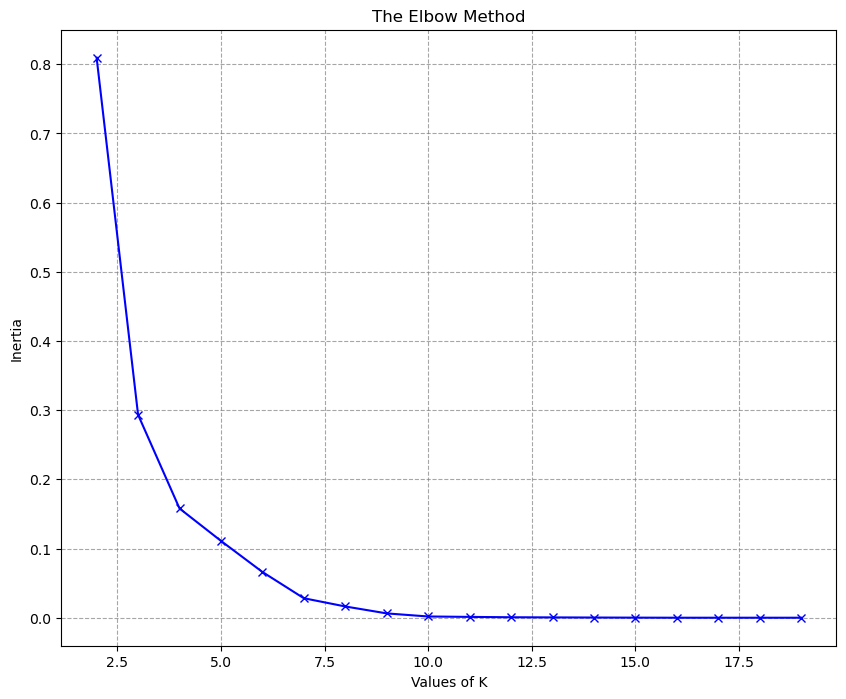

In [94]:
# find 'k' value by Elbow Method
plt.figure(figsize = [10, 8])
inertia = []
range_val = range(2,20)
for i in range_val:
    kmean=KMeans(n_clusters = i)
    kmean.fit_predict(X)
    inertia.append(kmean.inertia_)
    
plt.plot(range_val,inertia,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Inertia') 
plt.title('The Elbow Method')
plt.grid(True, linestyle='--', color='gray', alpha=0.7)
plt.show()

In [95]:
# the best k value is chosen where the line has the sharpest turn, in this case, k = 4

In [96]:
kclusters = 4

toronto_grouped_clustering = ita.drop('Neighbourhood', axis = 1)

# run k-means clustering
kmeans = KMeans(n_clusters = kclusters, random_state = 0).fit(toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

/opt/conda/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


array([3, 2, 0, 1, 0, 2, 1, 3, 2, 1], dtype=int32)

In [97]:
import numpy as np # library to handle data in a vectorized manner

# unique value in target column
np.unique(kmeans.labels_)

array([0, 1, 2, 3], dtype=int32)

In [98]:
# create a new dataframe that includes the cluster as well as the top 10 venues for each neighbourhood
to_merged = ita.copy()

# add clustering labels
to_merged["Cluster Labels"] = kmeans.labels_

In [100]:
to_merged.head()

,Neighbourhood,Fast Food Restaurant,Cluster Labels
0,Adelaide,0.40,3
1,Agincourt North,0.20,2
2,Albion Gardens,0.10,0
3,Bathurst Quay,0.25,1
4,Beaumond Heights,0.10,0


In [101]:
# merge to_merged with toronto_venues to add latitude/longitude for each neighbourhood
to_merged = to_merged.join(fast_food.set_index("Neighbourhood"), on = "Neighbourhood")

print(to_merged.shape)
to_merged.head()

(4259, 11)


,Neighbourhood,Fast Food Restaurant,Cluster Labels,Postalcode,Neighbourhood Latitude,Neighbourhood Longitude,Venue,fsq_id,Venue Latitude,Venue Longitude,Venue Category
0,Adelaide,0.4,3,M5H,43.650571,-79.384568,The Burger's Priest,5578720f498ee3b165b1f32b,43.648562,-79.387543,Burger Joint
0,Adelaide,0.4,3,M5H,43.650571,-79.384568,Karine's,4c90c810ae96a093599f9d46,43.653858,-79.390957,Fast Food Restaurant
0,Adelaide,0.4,3,M5H,43.650571,-79.384568,A&W Restaurant,57be1ded498edab44ddf8725,43.646031,-79.389757,American Restaurant
0,Adelaide,0.4,3,M5H,43.650571,-79.384568,Salad King,4ad4c061f964a52095f720e3,43.657618,-79.381691,Fast Food Restaurant
0,Adelaide,0.4,3,M5H,43.650571,-79.384568,Chipotle Mexican Grill,4adc9148f964a520512d21e3,43.656829,-79.380958,Fast Food Restaurant


In [102]:
# sort the results by Cluster Labels
print(to_merged.shape)
to_merged.sort_values(["Cluster Labels"], inplace=True)
to_merged.tail()

(4259, 11)


,Neighbourhood,Fast Food Restaurant,Cluster Labels,Postalcode,Neighbourhood Latitude,Neighbourhood Longitude,Venue,fsq_id,Venue Latitude,Venue Longitude,Venue Category
21,Grange Park,0.4,3,M5T,43.653206,-79.400049,Mini Bar,4b03ff12f964a520cd5022e3,43.647090,-79.396049,Café
21,Grange Park,0.4,3,M5T,43.653206,-79.400049,Sicilian Sidewalk Cafe,4b773d3ef964a520b78a2ee3,43.655330,-79.418590,Café
21,Grange Park,0.4,3,M5T,43.653206,-79.400049,Salad King,4ad4c061f964a52095f720e3,43.657618,-79.381691,Fast Food Restaurant
21,Grange Park,0.4,3,M5T,43.653206,-79.400049,Chipotle Mexican Grill,59304fea4186863fd6a112bb,43.649606,-79.391542,Fast Food Restaurant
0,Adelaide,0.4,3,M5H,43.650571,-79.384568,The Burger's Priest,5578720f498ee3b165b1f32b,43.648562,-79.387543,Burger Joint


In [103]:
to_merged['Venue Category'].value_counts()['Fast Food Restaurant']

866

In [108]:
# create map of clusters
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(to_merged['Neighbourhood Latitude'], to_merged['Neighbourhood Longitude'], to_merged['Neighbourhood'], to_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' - Cluster ' + str(cluster))
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill_color=rainbow[cluster-1],
        fill_opacity=0.8).add_to(map_clusters)
       
map_clusters

In [105]:
ita["Cluster Labels"] = kmeans.labels_
ita.head()

,Neighbourhood,Fast Food Restaurant,Cluster Labels
0,Adelaide,0.40,3
1,Agincourt North,0.20,2
2,Albion Gardens,0.10,0
3,Bathurst Quay,0.25,1
4,Beaumond Heights,0.10,0


In [106]:
# This will create a dataframe with borough of each neighbourhood which we will merge with each cluster dataframe
df_new = toronto_DF[['Borough', 'Neighbourhood']]
df_new.head()

,Borough,Neighbourhood
0,Central Toronto,Lawrence Park
1,Central Toronto,Davisville North
2,Central Toronto,North Toronto West
3,Central Toronto,Davisville
4,Central Toronto,Moore Park


In [107]:
# Red
cluster1 = to_merged.loc[to_merged['Cluster Labels'] == 0]
df_cluster1 = pd.merge(df_new, cluster1, on='Neighbourhood')
df_cluster1.head()

,Borough,Neighbourhood,Fast Food Restaurant,Cluster Labels,Postalcode,Neighbourhood Latitude,Neighbourhood Longitude,Venue,fsq_id,Venue Latitude,Venue Longitude,Venue Category
0,Central Toronto,Summerhill West,0.1,0,M4V,43.686412,-79.400049,Hot dog stand,4e2ef37b22717d70585b5f17,43.687797,-79.394450,Hot Dog Joint
1,Central Toronto,Summerhill West,0.1,0,M4V,43.686412,-79.400049,Chick-Fil-A,5d71504374f7d80008b792cd,43.669581,-79.386261,Fast Food Restaurant
2,Central Toronto,Summerhill West,0.1,0,M4V,43.686412,-79.400049,Subway,51e0a723498e834f4b7e4599,43.681850,-79.426015,Deli
3,Central Toronto,Summerhill West,0.1,0,M4V,43.686412,-79.400049,A&W Restaurant,61218d0ea313105ffb620ca0,43.669986,-79.383005,American Restaurant
4,Central Toronto,Summerhill West,0.1,0,M4V,43.686412,-79.400049,Subway,4c599f28b05c1b8dc333d6b1,43.670696,-79.394109,Deli


In [109]:
# Purple 
cluster2 = to_merged.loc[to_merged['Cluster Labels'] == 1]
df_cluster2 = pd.merge(df_new, cluster2, on='Neighbourhood')
df_cluster2.head()

,Borough,Neighbourhood,Fast Food Restaurant,Cluster Labels,Postalcode,Neighbourhood Latitude,Neighbourhood Longitude,Venue,fsq_id,Venue Latitude,Venue Longitude,Venue Category
0,Central Toronto,Davisville North,0.3,1,M4P,43.712751,-79.390197,Hollywood Gelato,4ad8ec59f964a5200b1621e3,43.706734,-79.375707,Ice Cream Parlor
1,Central Toronto,Davisville North,0.3,1,M4P,43.712751,-79.390197,Panago Pizza Inc,4f21daaae4b063d4fdda6292,43.708159,-79.392456,Pizzeria
2,Central Toronto,Davisville North,0.3,1,M4P,43.712751,-79.390197,Burger Shack,4ae65d5af964a520ada621e3,43.704728,-79.405670,Burger Joint
3,Central Toronto,Davisville North,0.3,1,M4P,43.712751,-79.390197,Pizza Hut,4bd76b035cf276b0623e9b00,43.700661,-79.373477,Pizzeria
4,Central Toronto,Davisville North,0.3,1,M4P,43.712751,-79.390197,Smoke's Poutinerie,53fb6edb498ea83bbd755b52,43.706435,-79.398407,Fast Food Restaurant


In [110]:
# Blue
cluster3 = to_merged.loc[to_merged['Cluster Labels'] == 2]
df_cluster3 = pd.merge(df_new, cluster3, on='Neighbourhood')
df_cluster3.head()

,Borough,Neighbourhood,Fast Food Restaurant,Cluster Labels,Postalcode,Neighbourhood Latitude,Neighbourhood Longitude,Venue,fsq_id,Venue Latitude,Venue Longitude,Venue Category
0,Central Toronto,Lawrence Park,0.2,2,M4N,43.72802,-79.38879,Druxy's Famous Deli,5954170873fe2534a00c7447,43.721503,-79.378853,Deli
1,Central Toronto,Lawrence Park,0.2,2,M4N,43.72802,-79.38879,Fit For Life,4b7ef2b1f964a520980b30e3,43.707236,-79.396662,Diner
2,Central Toronto,Lawrence Park,0.2,2,M4N,43.72802,-79.38879,Panago Pizza Inc,4f21daaae4b063d4fdda6292,43.708159,-79.392456,Pizzeria
3,Central Toronto,Lawrence Park,0.2,2,M4N,43.72802,-79.38879,The Burger's Priest,4ec6f17593ad41338c371e69,43.732610,-79.403851,Burger Joint
4,Central Toronto,Lawrence Park,0.2,2,M4N,43.72802,-79.38879,Pizza Pizza,4b6219e5f964a52074352ae3,43.731920,-79.414887,Pizzeria


In [111]:
# Turquoise
cluster4 = to_merged.loc[to_merged['Cluster Labels'] == 3]
df_cluster4 = pd.merge(df_new, cluster4, on='Neighbourhood')
df_cluster4.head()

,Borough,Neighbourhood,Fast Food Restaurant,Cluster Labels,Postalcode,Neighbourhood Latitude,Neighbourhood Longitude,Venue,fsq_id,Venue Latitude,Venue Longitude,Venue Category
0,Downtown Toronto,St. James Town,0.35,3,M4X,43.667967,-79.367675,Salad King,4ad4c061f964a52095f720e3,43.657618,-79.381691,Fast Food Restaurant
1,Downtown Toronto,St. James Town,0.35,3,M4X,43.667967,-79.367675,Chipotle Mexican Grill,4adc9148f964a520512d21e3,43.656829,-79.380958,Fast Food Restaurant
2,Downtown Toronto,St. James Town,0.35,3,M4X,43.667967,-79.367675,Five Guys Burgers & Fries,5064c3dde4b07c5a18986283,43.657110,-79.380956,Burger Joint
3,Downtown Toronto,St. James Town,0.35,3,M4X,43.667967,-79.367675,Karine's,4c90c810ae96a093599f9d46,43.653858,-79.390957,Fast Food Restaurant
4,Downtown Toronto,St. James Town,0.35,3,M4X,43.667967,-79.367675,Pie Squared,54049701498ede7ef8e77dfe,43.672314,-79.377997,Pie Shop


Text(0.5, 1.0, 'Average number of Fast Food Restaurants per Cluster')

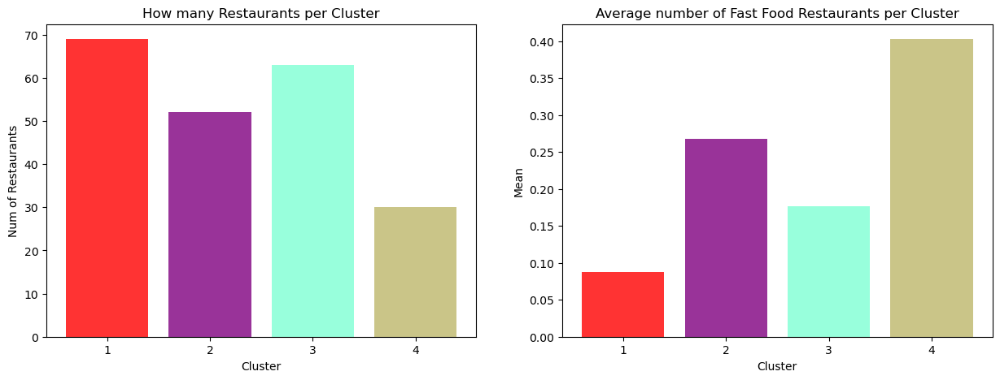

In [112]:
plt.figure(figsize=(15,5))

# Plot-1 ( Number of Restaurants per Cluster )

plt.subplot(1,2,1)
objects = (1,2,3,4)
y_pos = np.arange(len(objects))
performance = ita['Cluster Labels'].value_counts().to_frame().sort_index(ascending=True)
perf = performance.iloc[:, 0].tolist()
plt.bar(y_pos, perf, align='center', alpha=0.8, color=['red', 'purple','aquamarine', 'darkkhaki'])
plt.xticks(y_pos, objects)
plt.ylabel('Num of Restaurants')
plt.xlabel('Cluster')
plt.title('How many Restaurants per Cluster')

# Plot-2 ( Average number of Fast Food Restaurants per Cluster )

plt.subplot(1, 2, 2)
clusters_mean = [df_cluster1['Fast Food Restaurant'].mean(),df_cluster2['Fast Food Restaurant'].mean(),df_cluster3['Fast Food Restaurant'].mean(),
                df_cluster4['Fast Food Restaurant'].mean()]
y_pos = np.arange(len(objects))
perf_2 = clusters_mean
plt.bar(y_pos, perf_2, align='center', alpha=0.8, color=['red', 'purple','aquamarine', 'darkkhaki', 'green'])
plt.xticks(y_pos, objects)
plt.ylabel('Mean')
plt.xlabel('Cluster')
plt.title('Average number of Fast Food Restaurants per Cluster')

In [113]:
cluster2.to_csv('cluster2.csv', index=False)

In [114]:
# after comparing our top 5 neighbourhoods (M6H, M1K, M1B, M4C, and M2N) to cluster 2 (best cluster)
# only M6H and M1B are in cluster 2
# of those two neighbourhoods, M6H has the highest composite score
# therefore, we will be in neighbourhood M6H

In [115]:
# now we want further support
# we will look at the best cluster of pest control services and see if that aligns with neigbourhood M6H

In [116]:
# one hot encoding
to_onehot = pd.get_dummies(toronto_venues[['Venue Category']], prefix = "", prefix_sep = "")

# add neighbourhood column back to dataframe
to_onehot['Neighbourhoods'] = toronto_venues['Neighbourhood'] 

# move neighbourhood column to the first column
fixed_columns = [to_onehot.columns[-1]] + list(to_onehot.columns[:-1])
to_onehot = to_onehot[fixed_columns]

print(to_onehot.shape)
to_onehot.head()

(1317, 8)


,Neighbourhoods,Agriculture and Forestry Service,Carpet and Flooring Contractor,Casino,General Contractor,Home Inspection,Home Service,Pest Control Service
0,Lawrence Park,False,False,False,False,False,False,True
1,Lawrence Park,False,False,False,False,False,False,True
2,Lawrence Park,False,False,False,False,False,False,True
3,Lawrence Park,False,False,False,False,False,False,True
4,Davisville North,False,False,False,False,False,False,True


In [117]:
to_grouped = to_onehot.groupby(["Neighbourhoods"]).mean().reset_index() 

print(to_grouped.shape)
to_grouped.head()

(205, 8)


,Neighbourhoods,Agriculture and Forestry Service,Carpet and Flooring Contractor,Casino,General Contractor,Home Inspection,Home Service,Pest Control Service
0,Adelaide,0.0,0.0,0.0,0.0,0.05,0.15,0.8
1,Agincourt North,0.0,0.0,0.0,0.0,0.00,0.00,1.0
2,Albion Gardens,0.0,0.0,0.0,0.0,0.00,0.00,1.0
3,Bathurst Quay,0.0,0.0,0.0,0.0,0.00,0.00,1.0
4,Beaumond Heights,0.0,0.0,0.0,0.0,0.00,0.00,1.0


In [118]:
# here we only need Neighbourhoods and Pest Control Service
ita = to_grouped[["Neighbourhoods","Pest Control Service"]]
ita.head()

,Neighbourhoods,Pest Control Service
0,Adelaide,0.8
1,Agincourt North,1.0
2,Albion Gardens,1.0
3,Bathurst Quay,1.0
4,Beaumond Heights,1.0


In [119]:
# rename column "Neighbourhoods" to "Neighbourhood"
ita = ita.rename(columns={'Neighbourhoods':'Neighbourhood'})

In [120]:
# drop "Neighbourhood" column from the dataframe
X = ita.drop(['Neighbourhood'], axis = 1)

/opt/conda/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/opt/conda/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/opt/conda/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/opt/conda/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` ex

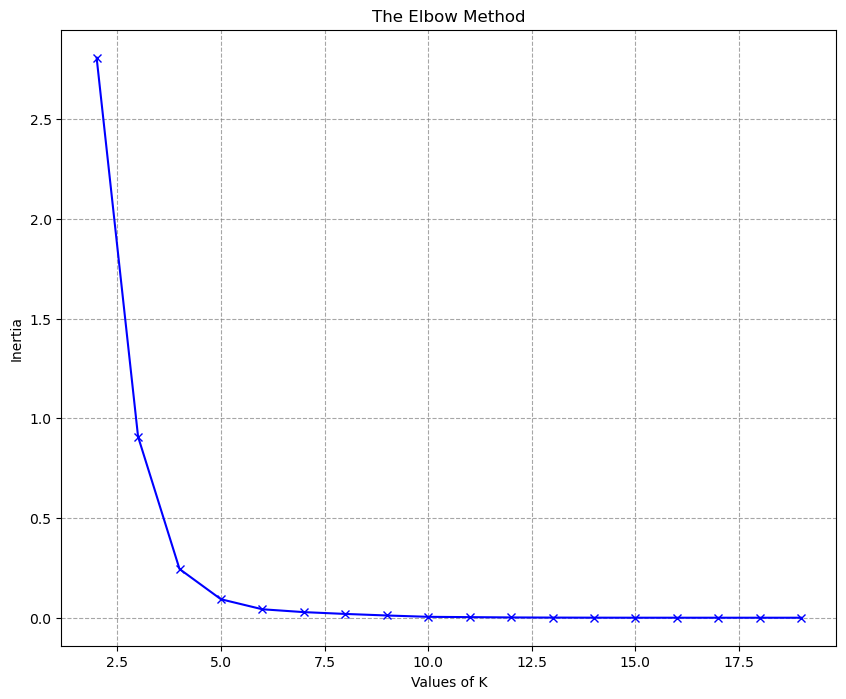

In [121]:
# find 'k' value by Elbow Method
plt.figure(figsize = [10, 8])
inertia = []
range_val = range(2,20)
for i in range_val:
    kmean=KMeans(n_clusters = i)
    kmean.fit_predict(X)
    inertia.append(kmean.inertia_)
    
plt.plot(range_val,inertia,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Inertia') 
plt.title('The Elbow Method')
plt.grid(True, linestyle='--', color='gray', alpha=0.7)
plt.show()

In [122]:
kclusters = 4

toronto_grouped_clustering = ita.drop('Neighbourhood', axis = 1)

# run k-means clustering
kmeans = KMeans(n_clusters = kclusters, random_state = 0).fit(toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

/opt/conda/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


array([1, 0, 0, 0, 0, 2, 1, 1, 1, 1], dtype=int32)

In [123]:
# create a new dataframe that includes the cluster as well as the top 10 venues for each neighbourhood
to_merged = ita.copy()

# add clustering labels
to_merged["Cluster Labels"] = kmeans.labels_

In [124]:
to_merged.head()

,Neighbourhood,Pest Control Service,Cluster Labels
0,Adelaide,0.8,1
1,Agincourt North,1.0,0
2,Albion Gardens,1.0,0
3,Bathurst Quay,1.0,0
4,Beaumond Heights,1.0,0


In [125]:
# merge to_merged with toronto_venues to add latitude/longitude for each neighbourhood
to_merged = to_merged.join(toronto_venues.set_index("Neighbourhood"), on = "Neighbourhood")

print(to_merged.shape)
to_merged.head()

(1317, 11)


,Neighbourhood,Pest Control Service,Cluster Labels,Postalcode,Neighbourhood Latitude,Neighbourhood Longitude,Venue,fsq_id,Venue Latitude,Venue Longitude,Venue Category
0,Adelaide,0.8,1,M5H,43.650571,-79.384568,Bed Bug Exterminator Toronto,572f83c1498e351823f03aa2,43.650991,-79.380964,Home Service
0,Adelaide,0.8,1,M5H,43.650571,-79.384568,Icon Wildlife Removal & Pest Control,5cd1813dd9a6e6002b4d9142,43.653493,-79.380520,Home Service
0,Adelaide,0.8,1,M5H,43.650571,-79.384568,The Bed Bug Tracker,c2b0eedcbd974c4e7b1a4990,43.649759,-79.376280,Pest Control Service
0,Adelaide,0.8,1,M5H,43.650571,-79.384568,Greenleaf Pest Control,545a9566498e607c73a235a0,43.649765,-79.376188,Pest Control Service
0,Adelaide,0.8,1,M5H,43.650571,-79.384568,Pest Control Guys,8a085c7e855840f5fc5c4416,43.645626,-79.393011,Pest Control Service


In [126]:
# sort the results by Cluster Labels
print(to_merged.shape)
to_merged.sort_values(["Cluster Labels"], inplace=True)
to_merged.tail()

(1317, 11)


,Neighbourhood,Pest Control Service,Cluster Labels,Postalcode,Neighbourhood Latitude,Neighbourhood Longitude,Venue,fsq_id,Venue Latitude,Venue Longitude,Venue Category
46,Markland Wood,0.500000,2,M9C,43.643515,-79.577201,Lady Bug Pest Control,9fb545ccd8a645106c926bd9,43.634064,-79.562080,Pest Control Service
173,Parkview Hill,0.571429,2,M4B,43.706397,-79.309937,Pesterminate Inc,58875ca53cccc610f8cc655f,43.691427,-79.288071,Home Service
151,Humberlea,0.000000,3,M9M,43.724766,-79.532242,Gemini Designs Inc,8582a5adc42a4581f5ca6128,43.716991,-79.524352,Carpet and Flooring Contractor
18,Emery,0.000000,3,M9M,43.724766,-79.532242,Gemini Designs Inc,8582a5adc42a4581f5ca6128,43.716991,-79.524352,Carpet and Flooring Contractor
137,Enclave of L4W,0.000000,3,M7R,43.636966,-79.615819,Speedy Pest Control,57f3c18dcd1054a28365159a,43.623067,-79.592248,Home Service


In [127]:
# create map of clusters
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(to_merged['Neighbourhood Latitude'], to_merged['Neighbourhood Longitude'], to_merged['Neighbourhood'], to_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' - Cluster ' + str(cluster))
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill_color=rainbow[cluster-1],
        fill_opacity=0.8).add_to(map_clusters)
       
map_clusters

In [128]:
ita["Cluster Labels"] = kmeans.labels_
ita.head()

,Neighbourhood,Pest Control Service,Cluster Labels
0,Adelaide,0.8,1
1,Agincourt North,1.0,0
2,Albion Gardens,1.0,0
3,Bathurst Quay,1.0,0
4,Beaumond Heights,1.0,0


In [129]:
# Red
cluster1 = to_merged.loc[to_merged['Cluster Labels'] == 0]
df_cluster1 = pd.merge(df_new, cluster1, on='Neighbourhood')
df_cluster1.head()

,Borough,Neighbourhood,Pest Control Service,Cluster Labels,Postalcode,Neighbourhood Latitude,Neighbourhood Longitude,Venue,fsq_id,Venue Latitude,Venue Longitude,Venue Category
0,Central Toronto,Lawrence Park,1.0,0,M4N,43.728020,-79.388790,Cain Pest & Wildlife Control,59bb5950112c6c44205c90af,43.728194,-79.402771,Pest Control Service
1,Central Toronto,Lawrence Park,1.0,0,M4N,43.728020,-79.388790,AAA Professional Wildlife Control,049ad9a78fbc4226a4e3142d,43.710908,-79.393269,Pest Control Service
2,Central Toronto,Lawrence Park,1.0,0,M4N,43.728020,-79.388790,Pest and Animal Control Toronto,52851516498ea2013e423f0b,43.711267,-79.396837,Pest Control Service
3,Central Toronto,Lawrence Park,1.0,0,M4N,43.728020,-79.388790,AAA Affordable Wildlife Control,274729bde84d49dc9148401e,43.712275,-79.396109,Pest Control Service
4,Central Toronto,Davisville North,1.0,0,M4P,43.712751,-79.390197,AAA Affordable Wildlife Control,274729bde84d49dc9148401e,43.712275,-79.396109,Pest Control Service


In [130]:
# Purple 
cluster2 = to_merged.loc[to_merged['Cluster Labels'] == 1]
df_cluster2 = pd.merge(df_new, cluster2, on='Neighbourhood')
df_cluster2.head()

,Borough,Neighbourhood,Pest Control Service,Cluster Labels,Postalcode,Neighbourhood Latitude,Neighbourhood Longitude,Venue,fsq_id,Venue Latitude,Venue Longitude,Venue Category
0,Central Toronto,Moore Park,0.8,1,M4T,43.689574,-79.38316,Advantage Pest Control Inc,662c6f812eda4bddd7a5f6f9,43.698131,-79.398298,Pest Control Service
1,Central Toronto,Moore Park,0.8,1,M4T,43.689574,-79.38316,Bird Barrier Systems,5c275c06622d45c98510d757,43.674070,-79.385526,Pest Control Service
2,Central Toronto,Moore Park,0.8,1,M4T,43.689574,-79.38316,My Pest Control,59a00c89002f4c45dfe94e79,43.669518,-79.391770,Pest Control Service
3,Central Toronto,Moore Park,0.8,1,M4T,43.689574,-79.38316,911 Bed Bugs,567cde2d498ef1c03ba6dcce,43.669321,-79.375136,Pest Control Service
4,Central Toronto,Moore Park,0.8,1,M4T,43.689574,-79.38316,Sierra Club Ontario,7bba51784e014388be91fe37,43.684080,-79.365928,Agriculture and Forestry Service


In [131]:
# Blue
cluster3 = to_merged.loc[to_merged['Cluster Labels'] == 2]
df_cluster3 = pd.merge(df_new, cluster3, on='Neighbourhood')
df_cluster3.head()

,Borough,Neighbourhood,Pest Control Service,Cluster Labels,Postalcode,Neighbourhood Latitude,Neighbourhood Longitude,Venue,fsq_id,Venue Latitude,Venue Longitude,Venue Category
0,East York,Parkview Hill,0.571429,2,M4B,43.706397,-79.309937,Standard Pest Control Svc,8d5b4e84a3324c3c71361d92,43.707820,-79.310820,Pest Control Service
1,East York,Parkview Hill,0.571429,2,M4B,43.706397,-79.309937,Four Seasons Wild Life Removal,56cc350bcd108dd03310ed43,43.705454,-79.300759,Pest Control Service
2,East York,Parkview Hill,0.571429,2,M4B,43.706397,-79.309937,Pro Pest Corp,599d9f12a92d9839df1f98b8,43.688187,-79.320684,Pest Control Service
3,East York,Parkview Hill,0.571429,2,M4B,43.706397,-79.309937,Aetna Pest Control Ltd,097a5200de34470496836412,43.684767,-79.318273,Home Inspection
4,East York,Parkview Hill,0.571429,2,M4B,43.706397,-79.309937,Mosquito Toronto,5cc12a0b826444002c1a3b8f,43.691999,-79.291061,Home Service


In [132]:
# Turquoise
cluster4 = to_merged.loc[to_merged['Cluster Labels'] == 3]
df_cluster4 = pd.merge(df_new, cluster4, on='Neighbourhood')
df_cluster4.head()

,Borough,Neighbourhood,Pest Control Service,Cluster Labels,Postalcode,Neighbourhood Latitude,Neighbourhood Longitude,Venue,fsq_id,Venue Latitude,Venue Longitude,Venue Category
0,Mississauga Canada Post Gateway Processing Centre,Enclave of L4W,0.0,3,M7R,43.636966,-79.615819,Speedy Pest Control,57f3c18dcd1054a28365159a,43.623067,-79.592248,Home Service
1,North York,Humberlea,0.0,3,M9M,43.724766,-79.532242,Gemini Designs Inc,8582a5adc42a4581f5ca6128,43.716991,-79.524352,Carpet and Flooring Contractor
2,North York,Emery,0.0,3,M9M,43.724766,-79.532242,Gemini Designs Inc,8582a5adc42a4581f5ca6128,43.716991,-79.524352,Carpet and Flooring Contractor


Text(0.5, 1.0, 'Average number of Pest Control Services per Cluster')

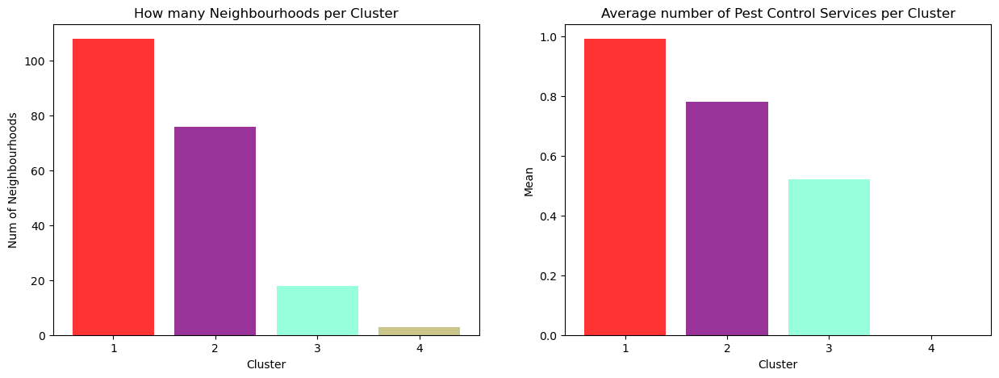

In [135]:
plt.figure(figsize=(15,5))

# Plot-1 ( Number of Neighbourhoods per Cluster )

plt.subplot(1,2,1)
objects = (1,2,3,4)
y_pos = np.arange(len(objects))
performance = ita['Cluster Labels'].value_counts().to_frame().sort_index(ascending=True)
perf = performance.iloc[:, 0].tolist()
plt.bar(y_pos, perf, align='center', alpha=0.8, color=['red', 'purple','aquamarine', 'darkkhaki'])
plt.xticks(y_pos, objects)
plt.ylabel('Num of Neighbourhoods')
plt.xlabel('Cluster')
plt.title('How many Neighbourhoods per Cluster')

# Plot-2 ( Average number of Pest Control Services per Cluster )

plt.subplot(1, 2, 2)
clusters_mean = [df_cluster1['Pest Control Service'].mean(),df_cluster2['Pest Control Service'].mean(),df_cluster3['Pest Control Service'].mean(),
                df_cluster4['Pest Control Service'].mean()]
y_pos = np.arange(len(objects))
perf_2 = clusters_mean
plt.bar(y_pos, perf_2, align='center', alpha=0.8, color=['red', 'purple','aquamarine', 'darkkhaki', 'green'])
plt.xticks(y_pos, objects)
plt.ylabel('Mean')
plt.xlabel('Cluster')
plt.title('Average number of Pest Control Services per Cluster')

In [ ]:
# cluster 4 is pretty bad, only 3 neighbourhoods, but no pest control services, could probably be covered by pest control services in other clusters
# cluster 3 is bad, small number of neighbourhoods opposed to high number of pest control services, too much competition
# cluster 1 is okay, lots of neighbourhoods but also lots of competition
# cluster 2 is good, good amount of neighbourhoods with a lower barrier to entry compared to cluster 1

In [136]:
cluster2.to_csv('cluster2_pest.csv', index = False)

In [ ]:
# M6H still best neighbourhood

In [138]:
# Pest control services in M6H
target = 'Dufferin'

search_area = toronto_venues[toronto_venues['Neighbourhood'] == target]
display(search_area)
latitude = toronto_DF[toronto_DF['Neighbourhood'] == target]['Latitude']
longitude = toronto_DF[toronto_DF['Neighbourhood'] == target]['Longitude']
map_neighborhood = folium.Map(location=[latitude, longitude], zoom_start=14)

# add markers to map
for lat, lng, venue, neighborhood in zip(search_area['Venue Latitude'], search_area['Venue Longitude'], search_area['Venue'], search_area['Neighbourhood']):
    label = '{},{}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_neighborhood)

map_neighborhood

,Neighbourhood,Postalcode,Neighbourhood Latitude,Neighbourhood Longitude,Venue,fsq_id,Venue Latitude,Venue Longitude,Venue Category
1191,Dufferin,M6H,43.669005,-79.442259,Kind Pest Control,560aeed5498ef4a0fbc7cddd,43.670113,-79.439897,Home Service
1192,Dufferin,M6H,43.669005,-79.442259,Bugs Heat Terminator,027cfef377b746164556f43d,43.672905,-79.443947,Pest Control Service
1193,Dufferin,M6H,43.669005,-79.442259,Toronto Air Soft,5011b02fe4b037378be1f1b6,43.670398,-79.435219,Casino
1194,Dufferin,M6H,43.669005,-79.442259,Pest Control Toronto,57715064498ec3ff9146ab02,43.665764,-79.450236,Home Service
1195,Dufferin,M6H,43.669005,-79.442259,Pest Control Toronto Team,5362917211d25710fe57f69e,43.661248,-79.443665,Pest Control Service
1196,Dufferin,M6H,43.669005,-79.442259,Bed Bug Exterminator Pro,57c7076f498e500d301f8228,43.656958,-79.448588,Pest Control Service
1197,Dufferin,M6H,43.669005,-79.442259,Merkem Pest Solutions,589bd7aa0bc55b5f8ef35448,43.661951,-79.424793,Home Service
1198,Dufferin,M6H,43.669005,-79.442259,SWAT Wildlife,4f8e92e7e4b0036b6f308fd9,43.654321,-79.440122,Pest Control Service
1199,Dufferin,M6H,43.669005,-79.442259,Quest Pest Management,9d648bfa2f4a4bf41ed7d037,43.671627,-79.420683,Pest Control Service
1200,Dufferin,M6H,43.669005,-79.442259,Pest Control Toronto .ca,9c2c9d2221964df80a233a2b,43.671633,-79.420590,Pest Control Service


/opt/conda/lib/python3.11/site-packages/folium/utilities.py:94: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  float(coord)
/opt/conda/lib/python3.11/site-packages/folium/utilities.py:100: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  if math.isnan(float(coord)):
/opt/conda/lib/python3.11/site-packages/folium/utilities.py:102: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return [float(x) for x in coords]
